Prepration and Setup

In [ ]:
from google.colab import drive
import os

# 1. Connect Google Drive to the Colab environment
DRIVE_MOUNT_POINT = '/content/drive'
drive.mount(DRIVE_MOUNT_POINT)

# 2. Define project and data path variables
# Update these paths according to your own Drive structure
PROJECT_PATH = os.path.join(DRIVE_MOUNT_POINT, 'MyDrive/RGB-Dataset')
ZIP_FILE_PATH = os.path.join(PROJECT_PATH, 'cv_dataset4.zip')
UNZIP_DESTINATION = '/content/unzipped_dataset' # Extracting to Colab's temporary disk is faster

MIDDLEBURY_ZIP_PATH = '/content/drive/MyDrive/MiddleBurryStereo-Dataset/MiddleBurryStereo.zip'
MIDDLEBURY_UNZIP_DESTINATION = '/content/middlebury_dataset' # Extracting to Colab's temporary disk is faster

# 4. Define paths to be used in training and evaluation code
IMAGE_FOLDER_PATH = os.path.join(UNZIP_DESTINATION, 'cv_dataset4/rgb_images') # Update according to the folder name inside the zip
LABEL_FOLDER_PATH = os.path.join(UNZIP_DESTINATION, 'cv_dataset4/sift_labels') # Update according to the folder name inside the zip

MODEL_SAVE_PATH = "drive/MyDrive/RGB_D_Dataset/superpoint_model_best_100k.pth" # Update the path
CHECKPOINT_PATH = "drive/MyDrive/RGB_D_Dataset/checkpoints_100k/" # For intermediate checkpoints


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import zipfile # Using Python's built-in zip library provides more flexibility

# 3. Check if the dataset has already been unzipped
if not os.path.exists(UNZIP_DESTINATION):
    print(f"Folder '{UNZIP_DESTINATION}' not found. Unzipping the file...")
    # !unzip command allows us to run shell commands in Colab
    # -q (quiet) -> shows less output
    # -d (destination) -> specifies the target folder to extract files into
    !unzip -q "{ZIP_FILE_PATH}" -d "{UNZIP_DESTINATION}"
    print("Zip file successfully extracted.")
else:
    print(f"Folder '{UNZIP_DESTINATION}' already exists. Unzip operation skipped.")

# 2. Check if the Middlebury dataset has already been unzipped
if not os.path.exists(MIDDLEBURY_UNZIP_DESTINATION):
    print(f"Folder '{MIDDLEBURY_UNZIP_DESTINATION}' not found. Unzipping the file...")

    # Create the target folder
    os.makedirs(MIDDLEBURY_UNZIP_DESTINATION)

    # Use Python's built-in library instead of !unzip command
    with zipfile.ZipFile(MIDDLEBURY_ZIP_PATH, 'r') as zip_ref:
        zip_ref.extractall(MIDDLEBURY_UNZIP_DESTINATION)

    print(f"Zip file successfully extracted to '{MIDDLEBURY_UNZIP_DESTINATION}'.")

else:
    print(f"Folder '{MIDDLEBURY_UNZIP_DESTINATION}' already exists. Unzip operation skipped.")


Folder '/content/unzipped_dataset' not found. Unzipping the file...
Zip file successfully extracted.
Folder '/content/middlebury_dataset' not found. Unzipping the file...
Zip file successfully extracted to '/content/middlebury_dataset'.


KeyPoint Dataset Class

In [ ]:
import os
import torch
import numpy as np
import cv2
from torch.utils.data import Dataset
import random
from scipy.ndimage import gaussian_filter

class KeypointDataset(Dataset):
    def __init__(self, image_folder, label_folder, image_size=(240, 320), max_keypoints=500, augment=False, files_to_use=None):
        self.image_folder = image_folder
        self.label_folder = label_folder
        self.image_size = image_size
        self.max_keypoints = max_keypoints
        self.augment = augment
        self.descriptor_dim = 128 # Fixed for SIFT

        if files_to_use is not None:
            self.image_files = files_to_use
        else:
            # Only take those with a corresponding label file
            all_pngs = {os.path.splitext(f)[0] for f in os.listdir(image_folder) if f.endswith('.png')}
            all_labels = {os.path.splitext(f)[0].replace('_kp', '') for f in os.listdir(label_folder) if f.endswith('_kp.npy')}
            valid_bases = sorted(list(all_pngs.intersection(all_labels)))
            self.image_files = [f"{base}.png" for base in valid_bases]

    def __len__(self):
        return len(self.image_files)

    def get_affine_transform(self):
        angle = random.uniform(-20, 20)
        scale = random.uniform(0.9, 1.1)
        tx = random.uniform(-10, 10)
        ty = random.uniform(-10, 10)
        center = (self.image_size[1] / 2, self.image_size[0] / 2)
        M = cv2.getRotationMatrix2D(center, angle, scale)
        M[:, 2] += (tx, ty)
        return M

    def __getitem__(self, idx):
        filename = self.image_files[idx]
        img_path = os.path.join(self.image_folder, filename)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        if img is None: # If the image could not be read, try the next one
            print(f"Warning: Could not read {img_path}, skipping.")
            return self.__getitem__((idx + 1) % len(self))

        original_size = img.shape
        img_resized = cv2.resize(img, (self.image_size[1], self.image_size[0]))

        base_name = os.path.splitext(filename)[0]
        kp_path = os.path.join(self.label_folder, f"{base_name}_kp.npy")
        desc_path = os.path.join(self.label_folder, f"{base_name}_desc.npy")

        # Load original keypoints and descriptors
        keypoints_orig = np.load(kp_path).astype(np.float32)
        descriptors_orig = np.load(desc_path).astype(np.float32)

        # Scale keypoints to match the resized image
        keypoints = keypoints_orig.copy()
        keypoints[:, 0] *= self.image_size[1] / original_size[1]
        keypoints[:, 1] *= self.image_size[0] / original_size[0]

        if self.augment:
            # Affine transform
            M = self.get_affine_transform()
            img_resized = cv2.warpAffine(img_resized, M, (self.image_size[1], self.image_size[0]))
            keypoints = cv2.transform(keypoints.reshape(-1, 1, 2), M).reshape(-1, 2)

            # Discard keypoints outside image boundaries
            h, w = self.image_size
            valid_mask = (keypoints[:, 0] >= 0) & (keypoints[:, 0] < w) & \
                         (keypoints[:, 1] >= 0) & (keypoints[:, 1] < h)
            keypoints = keypoints[valid_mask]
            descriptors_orig = descriptors_orig[valid_mask]

            # Photometric augmentation: brightness + contrast
            img_resized = img_resized.astype(np.float32)
            img_resized = np.clip(img_resized * random.uniform(0.8, 1.2), 0, 255)  # contrast
            img_resized = np.clip(img_resized + random.uniform(-20, 20), 0, 255)   # brightness
            img_resized = img_resized.astype(np.uint8)

        # Initialize maps
        heatmap = np.zeros(self.image_size, dtype=np.float32)
        descriptor_map = np.zeros((self.descriptor_dim, self.image_size[0], self.image_size[1]), dtype=np.float32)

        for i, (x, y) in enumerate(keypoints):
            x_int = int(round(x))
            y_int = int(round(y))
            if 0 <= x_int < self.image_size[1] and 0 <= y_int < self.image_size[0]:
                heatmap[y_int, x_int] = 1.0

        heatmap = gaussian_filter(heatmap, sigma=1.0)
        if np.max(heatmap) > 0: heatmap /= np.max(heatmap)

        # 2. Padded Keypoint and Descriptor Lists
        num_kp = len(keypoints)
        padded_kps = np.zeros((self.max_keypoints, 2), dtype=np.float32)
        padded_descs = np.zeros((self.max_keypoints, self.descriptor_dim), dtype=np.float32)

        if num_kp > 0:
            # If there are more than max_keypoints, choose the strongest ones
            if num_kp > self.max_keypoints:
                # Since SIFT response is not stored in keypoint data, select randomly
                indices = np.random.choice(num_kp, self.max_keypoints, replace=False)
                keypoints = keypoints[indices]
                descriptors_orig = descriptors_orig[indices]
                num_kp = self.max_keypoints

            padded_kps[:num_kp] = keypoints
            padded_descs[:num_kp] = descriptors_orig

        # Convert to tensors
        img_tensor = torch.from_numpy(img_resized.astype(np.float32)).unsqueeze(0) / 255.0
        heatmap_tensor = torch.from_numpy(heatmap).unsqueeze(0)
        kp_coords_tensor = torch.from_numpy(padded_kps)
        descriptors_tensor = torch.from_numpy(padded_descs)

        #return coordinate and descriptor lists
        return img_tensor, heatmap_tensor, kp_coords_tensor, descriptors_tensor


Model

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SuperPointNet(nn.Module):
    """
    A VGG-style CNN architecture inspired by SuperPoint, to be trained from scratch.
    Enhanced with BatchNorm layers.
    """
    def __init__(self, descriptor_dim=128):
        super(SuperPointNet, self).__init__()
        self.descriptor_dim = descriptor_dim

        # --- Shared Operations (Declaration Only) ---
        self.relu = nn.ReLU(inplace=True)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # --- Shared Encoder Layers (Declaration Only) ---
        self.conv1a = nn.Conv2d(1, 64, kernel_size=3, padding=1)
        self.bn1a = nn.BatchNorm2d(64)
        self.conv1b = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.bn1b = nn.BatchNorm2d(64)

        self.conv2a = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.bn2a = nn.BatchNorm2d(64)
        self.conv2b = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.bn2b = nn.BatchNorm2d(64)

        self.conv3a = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3a = nn.BatchNorm2d(128)
        self.conv3b = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.bn3b = nn.BatchNorm2d(128)

        self.conv4a = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.bn4a = nn.BatchNorm2d(128)
        self.conv4b = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.bn4b = nn.BatchNorm2d(128)

        # --- Detector Head Layers (Declaration Only) ---
        self.conv_det_a = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.bn_det_a = nn.BatchNorm2d(256)
        self.conv_det_b = nn.Conv2d(256, 1, kernel_size=1)

        # --- Descriptor Head Layers (Declaration Only) ---
        self.conv_desc_a = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.bn_desc_a = nn.BatchNorm2d(256)
        self.conv_desc_b = nn.Conv2d(256, self.descriptor_dim, kernel_size=1)

    def forward(self, x): # Input is taken as 'x'
        # This method passes the data through the layers defined in __init__.

        # Encoder
        x = self.relu(self.bn1a(self.conv1a(x)))
        x = self.relu(self.bn1b(self.conv1b(x)))
        x = self.pool(x)

        x = self.relu(self.bn2a(self.conv2a(x)))
        x = self.relu(self.bn2b(self.conv2b(x)))
        x = self.pool(x)

        x = self.relu(self.bn3a(self.conv3a(x)))
        x = self.relu(self.bn3b(self.conv3b(x)))
        x = self.pool(x)

        x = self.relu(self.bn4a(self.conv4a(x)))
        features = self.relu(self.bn4b(self.conv4b(x)))

        # Detector Head
        det_out = self.relu(self.bn_det_a(self.conv_det_a(features)))
        heatmap_logits = self.conv_det_b(det_out) # Low-resolution

        # Descriptor Head
        desc_out = self.relu(self.bn_desc_a(self.conv_desc_a(features)))
        desc_raw = self.conv_desc_b(desc_out) # Low-resolution

        # Normalize descriptors
        desc_norm = F.normalize(desc_raw, p=2, dim=1)

        # Return low-resolution outputs
        return heatmap_logits, desc_norm


Training

Veri seti hazırlanıyor ve bölünüyor...
Toplam veri: 101230, Eğitim verisi: 86046, Doğrulama verisi: 15184
Detector loss 'pos_weight' değeri: 500.00
Epoch 1/20 [LR=1.0e-03] -> Train Loss: 1.0750 (P: 0.7719, D: 0.3032) | Val Loss: 0.9341 (P: 0.6587, D: 0.2754)
  -> New best model saved
Epoch 2/20 [LR=1.0e-03] -> Train Loss: 0.8525 (P: 0.5846, D: 0.2679) | Val Loss: 0.8819 (P: 0.6178, D: 0.2641)
  -> New best model saved
Epoch 3/20 [LR=1.0e-03] -> Train Loss: 0.8105 (P: 0.5510, D: 0.2594) | Val Loss: 0.8327 (P: 0.5724, D: 0.2602)
  -> New best model saved
Epoch 4/20 [LR=1.0e-03] -> Train Loss: 0.7802 (P: 0.5261, D: 0.2541) | Val Loss: 0.8083 (P: 0.5515, D: 0.2568)
  -> New best model saved
Epoch 5/20 [LR=1.0e-03] -> Train Loss: 0.7612 (P: 0.5100, D: 0.2512) | Val Loss: 0.7915 (P: 0.5385, D: 0.2531)
  -> New best model saved
Epoch 6/20 [LR=1.0e-03] -> Train Loss: 0.7469 (P: 0.4981, D: 0.2488) | Val Loss: 0.7605 (P: 0.5103, D: 0.2502)
  -> New best model saved
Epoch 7/20 [LR=1.0e-03] -> Tra

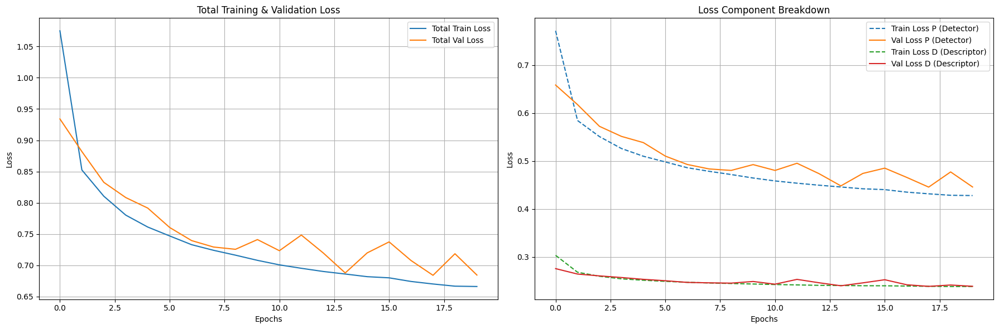

In [ ]:
import torch
import torch.optim as optim
from torch.utils.data import DataLoader, random_split, Subset
import numpy as np
import matplotlib.pyplot as plt
import os

# --- 1. Parameters and Configuration ---
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
BATCH_SIZE = 256
TOTAL_EPOCHS = 20
LEARNING_RATE = 1e-3
LAMBDA_LOSS = 1.0     # Critical parameter, to be tuned based on training logs
VALIDATION_SPLIT = 0.15
os.makedirs(CHECKPOINT_PATH, exist_ok=True)
VALIDATION_SPLIT = 0.15

# --- 2. Split the Dataset ---
print("Preparing and splitting the dataset...")
train_dataset_obj = KeypointDataset(IMAGE_FOLDER_PATH, LABEL_FOLDER_PATH, augment=True)
val_dataset_obj = KeypointDataset(IMAGE_FOLDER_PATH, LABEL_FOLDER_PATH, augment=False)

full_ids = list(range(len(train_dataset_obj)))
num_data = len(full_ids)
num_val = int(VALIDATION_SPLIT * num_data)
num_train = num_data - num_val

train_indices, val_indices = random_split(
    full_ids, [num_train, num_val],
    generator=torch.Generator().manual_seed(42)
)

train_dataset = Subset(train_dataset_obj, train_indices)
val_dataset = Subset(val_dataset_obj, val_indices)

train_loader = DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(dataset=val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)
print(f"Total data: {num_data}, Training: {len(train_dataset)}, Validation: {len(val_dataset)}")

# --- 3. Model, Optimizer, Loss Functions ---
model = SuperPointNet().to(DEVICE)

# Single optimizer for all parameters with a common learning rate
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5)

# Strong Detector Loss (BCE + pos_weight)
# You can compute a more accurate value by scanning a few batches, but 0.002 is a good start
pos_ratio = 0.002
pos_weight_value = 1 / pos_ratio
loss_fn_det = torch.nn.BCEWithLogitsLoss(pos_weight=torch.tensor([pos_weight_value], device=DEVICE))
print(f"Detector loss 'pos_weight' value: {pos_weight_value:.2f}")

# Descriptor loss (Triplet-based)
loss_fn_desc = nn.TripletMarginLoss(margin=0.2, p=2, reduction='mean')

# SCALER DEFINITION (using new API)
from torch.amp.grad_scaler import GradScaler
scaler = GradScaler(init_scale=2.**16, enabled=(DEVICE == 'cuda'))

# --- HELPER FUNCTION ---
def compute_descriptor_loss(pred_desc_small, target_desc_list, kp_coords_list, image_size, loss_fn):
    """
    pred_desc_small: (B, D, H_small, W_small) - Low-res descriptor map from model
    target_desc_list: (B, N, D) - Original GT descriptors
    kp_coords_list: (B, N, 2) - Original GT keypoint coordinates (in image space)
    """
    b, c, h_small, w_small = pred_desc_small.shape
    h_img, w_img = image_size

    # Scaling factors from image to feature map
    scale_x = w_small / w_img
    scale_y = h_small / h_img

    batch_losses = []
    for i in range(b):
        kp_coords = kp_coords_list[i]
        target_descs = target_desc_list[i]

        # Ignore padded (0, 0) keypoints
        valid_mask = torch.any(kp_coords != 0, dim=1)
        if valid_mask.sum() < 2:
            continue

        kp_coords_valid = kp_coords[valid_mask]
        target_descs_valid = target_descs[valid_mask]

        # Scale to descriptor map space
        x_small = (kp_coords_valid[:, 0] * scale_x).round().long().clamp(0, w_small - 1)
        y_small = (kp_coords_valid[:, 1] * scale_y).round().long().clamp(0, h_small - 1)

        # Anchor: predicted descriptors
        anchor = pred_desc_small[i, :, y_small, x_small].T  # (N_valid, D)

        # Positive: ground truth descriptors
        positive = target_descs_valid

        # Negative: randomly permuted positive descriptors
        num_kps = anchor.shape[0]
        perm = torch.randperm(num_kps, device=anchor.device)
        for j in range(num_kps):
            if perm[j] == j: perm[j] = (j + 1) % num_kps
        negative = positive[perm]

        batch_losses.append(loss_fn(anchor, positive, negative))

    if not batch_losses:
        return torch.tensor(0.0, device=pred_desc_small.device)

    return torch.mean(torch.stack(batch_losses))


# --- 4. Training and Validation Loop ---
history = {
    'train_loss': [], 'val_loss': [],
    'train_loss_p': [], 'val_loss_p': [],
    'train_loss_d': [], 'val_loss_d': []
}
best_val_loss = float('inf')

for epoch in range(TOTAL_EPOCHS):
    # --- TRAINING ---
    model.train()
    running_loss, running_loss_p, running_loss_d = 0.0, 0.0, 0.0

    for img, target_heatmap, kp_coords, target_desc in train_loader:
        img, target_heatmap, target_desc, kp_coords = img.to(DEVICE), target_heatmap.to(DEVICE), target_desc.to(DEVICE), kp_coords.to(DEVICE)

        optimizer.zero_grad(set_to_none=True)

        with torch.autocast(device_type=DEVICE, dtype=torch.float16, enabled=(DEVICE == 'cuda')):
            # Model returns low-res heatmaps and descriptors
            pred_heatmap_logits, pred_desc_small = model(img)

            # Resize GT heatmap to match prediction
            gt_heatmap_small = F.interpolate(
                target_heatmap,
                size=pred_heatmap_logits.shape[2:],
                mode='bilinear',
                align_corners=False
            )
            loss_p = loss_fn_det(pred_heatmap_logits, gt_heatmap_small)

            # Descriptor loss with provided keypoint coordinates
            loss_d = compute_descriptor_loss(pred_desc_small, target_desc, kp_coords, img.shape[-2:], loss_fn_desc)

            total_loss = loss_p + LAMBDA_LOSS * loss_d

        scaler.scale(total_loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += total_loss.item()
        running_loss_p += loss_p.item()
        running_loss_d += loss_d.item()

    history['train_loss'].append(running_loss / len(train_loader))
    history['train_loss_p'].append(running_loss_p / len(train_loader))
    history['train_loss_d'].append(running_loss_d / len(train_loader))

    # --- VALIDATION ---
    model.eval()
    running_val_loss, running_val_loss_p, running_val_loss_d = 0.0, 0.0, 0.0
    with torch.no_grad():
        for img, target_heatmap, kp_coords, target_desc in val_loader:
            img, target_heatmap, target_desc, kp_coords = img.to(DEVICE), target_heatmap.to(DEVICE), target_desc.to(DEVICE), kp_coords.to(DEVICE)
            with torch.autocast(device_type=DEVICE, dtype=torch.float16, enabled=(DEVICE == 'cuda')):
                pred_heatmap_logits, pred_desc_small = model(img)

                gt_heatmap_small = F.interpolate(target_heatmap, size=pred_heatmap_logits.shape[2:], mode='bilinear', align_corners=False)
                loss_p = loss_fn_det(pred_heatmap_logits, gt_heatmap_small)

                loss_d = compute_descriptor_loss(pred_desc_small, target_desc, kp_coords, img.shape[-2:], loss_fn_desc)

                total_val_loss = loss_p + LAMBDA_LOSS * loss_d

            running_val_loss += total_val_loss.item()
            running_val_loss_p += loss_p.item()
            running_val_loss_d += loss_d.item()

    epoch_val_loss = running_val_loss / len(val_loader)
    history['val_loss'].append(epoch_val_loss)
    history['val_loss_p'].append(running_val_loss_p / len(val_loader))
    history['val_loss_d'].append(running_val_loss_d / len(val_loader))

    scheduler.step(epoch_val_loss)

    print(f"Epoch {epoch+1}/{TOTAL_EPOCHS} [LR={optimizer.param_groups[0]['lr']:.1e}] -> "
          f"Train Loss: {history['train_loss'][-1]:.4f} (P: {history['train_loss_p'][-1]:.4f}, D: {history['train_loss_d'][-1]:.4f}) | "
          f"Val Loss: {history['val_loss'][-1]:.4f} (P: {history['val_loss_p'][-1]:.4f}, D: {history['val_loss_d'][-1]:.4f})")

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        torch.save(model.state_dict(), MODEL_SAVE_PATH)
        print(f"  -> New best model saved")

    if (epoch + 1) % 10 == 0:
        torch.save(model.state_dict(), os.path.join(CHECKPOINT_PATH, f'model_epoch_{epoch+1}.pth'))
        print(f"  -> Intermediate checkpoint saved: epoch {epoch+1}")

print("\nTraining completed.")

# --- 5. Plot Loss History ---
plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
plt.plot(history['train_loss'], label='Total Train Loss')
plt.plot(history['val_loss'], label='Total Val Loss')
plt.title('Total Training & Validation Loss')
plt.xlabel('Epochs'); plt.ylabel('Loss'); plt.legend(); plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history['train_loss_p'], label='Train Loss P (Detector)', linestyle='--')
plt.plot(history['val_loss_p'], label='Val Loss P (Detector)')
plt.plot(history['train_loss_d'], label='Train Loss D (Descriptor)', linestyle='--')
plt.plot(history['val_loss_d'], label='Val Loss D (Descriptor)')
plt.title('Loss Component Breakdown')
plt.xlabel('Epochs'); plt.ylabel('Loss'); plt.legend(); plt.grid(True)

plt.tight_layout()
plt.show()


Helper Function

In [ ]:
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision.ops import nms as torch_nms
from tqdm.notebook import tqdm
import numpy as np
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

def match_keypoints(pred_pts, gt_pts, tol=3):
    """
    Performs one-to-one (greedy) matching between two sets of keypoints.
    pred_pts, gt_pts: numpy arrays of shape (N, 2)
    returns: array of shape (M, 2) containing matched [pred_idx, gt_idx] pairs
    """
    if pred_pts.shape[0] == 0 or gt_pts.shape[0] == 0:
        return np.empty((0, 2), dtype=int)

    dist_matrix = cdist(pred_pts, gt_pts)
    potential_matches = np.where(dist_matrix <= tol)

    if len(potential_matches[0]) == 0:
        return np.empty((0, 2), dtype=int)

    # Prioritize matches with smaller distances
    sorted_indices = np.argsort(dist_matrix[potential_matches])
    pred_indices = potential_matches[0][sorted_indices]
    gt_indices = potential_matches[1][sorted_indices]

    # Ensure each keypoint is matched at most once
    matched_pred_mask = np.zeros(pred_pts.shape[0], dtype=bool)
    matched_gt_mask = np.zeros(gt_pts.shape[0], dtype=bool)
    matches = []
    for pred_i, gt_i in zip(pred_indices, gt_indices):
        if not matched_pred_mask[pred_i] and not matched_gt_mask[gt_i]:
            matches.append([pred_i, gt_i])
            matched_pred_mask[pred_i] = True
            matched_gt_mask[gt_i] = True

    return np.array(matches, dtype=int)


Evaluation

In [ ]:
def evaluate_model(ckpt_path, image_dir, label_dir, size=(240, 320), threshold=0.05, nms_radius=4, tol=3, eval_subset_ratio=0.2):

    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    # 1. Create the full evaluation dataset
    full_eval_ds = KeypointDataset(image_dir, label_dir, image_size=size, augment=False)

    # 2. Use a subset of the dataset if needed
    if eval_subset_ratio < 1.0:

        num_total_data = len(full_eval_ds)
        subset_size = int(num_total_data * eval_subset_ratio)

        # Select random indices (fix seed for reproducibility)
        np.random.seed(42)
        random_indices = np.random.choice(num_total_data, subset_size, replace=False)

        from torch.utils.data import Subset
        eval_ds = Subset(full_eval_ds, random_indices)

    else:
        eval_ds = full_eval_ds

    # 3. Create DataLoader with the full or subset dataset
    loader = DataLoader(eval_ds, batch_size=1, shuffle=False, num_workers=2)

    # Load model
    model = SuperPointNet().to(device)
    model.load_state_dict(torch.load(ckpt_path, map_location=device))
    model.eval()

    precisions, recalls, match_scores = [], [], []
    print("⇢ Evaluation started...")

    with torch.no_grad():
        for i, (img, _, padded_kps_all, padded_descs_all) in enumerate(tqdm(loader)):
            img = img.to(device)

            # --- 1. Forward Pass ---
            logits_small, desc_small = model(img)
            Hs, Ws = logits_small.shape[2:]

            # --- 2. Prepare GT keypoints ---
            padded_kpts = padded_kps_all.squeeze(0).cpu()
            valid_gt_mask = torch.any(padded_kpts != 0, dim=1)
            gt_kpts = padded_kpts[valid_gt_mask].numpy()

            # --- 3. Extract keypoints using MaxPool-based NMS ---
            prob_high_res = torch.sigmoid(F.interpolate(logits_small, size=size, mode='bilinear')).squeeze().cpu()

            if gt_kpts.shape[0] == 0:
                continue

            # --- NMS LOGIC ---
            max_pooled_prob = F.max_pool2d(prob_high_res.unsqueeze(0), kernel_size=nms_radius*2+1, stride=1, padding=nms_radius).squeeze()
            peaks_mask = (prob_high_res == max_pooled_prob)
            final_mask = peaks_mask & (prob_high_res > threshold)

            if not torch.any(final_mask):
                precisions.append(1.0)
                recalls.append(0.0)
                continue

            ys, xs = torch.nonzero(final_mask, as_tuple=True)
            pred_kpts = torch.stack([xs, ys], dim=1).cpu().numpy()
            # --- NMS DONE ---

            # --- 4. Compute Detector Metrics ---
            matches = match_keypoints(pred_kpts, gt_kpts, tol=tol)
            tp = len(matches)
            precisions.append(tp / (pred_kpts.shape[0] + 1e-8))
            recalls.append(tp / (gt_kpts.shape[0] + 1e-8))

            # --- 5. Compute Descriptor Similarity ---
            if tp > 0:
                m_pred_idx = matches[:, 0]
                m_gt_idx = matches[:, 1]
                matched_pred_kpts = pred_kpts[m_pred_idx]

                scale_x, scale_y = Ws / size[1], Hs / size[0]
                xs_s = np.clip(np.round(matched_pred_kpts[:, 0] * scale_x), 0, Ws - 1).astype(np.int64)
                ys_s = np.clip(np.round(matched_pred_kpts[:, 1] * scale_y), 0, Hs - 1).astype(np.int64)

                desc_cpu_tensor = desc_small[0].cpu()
                pred_descs = desc_cpu_tensor[:, ys_s, xs_s].T.numpy()
                pred_descs /= np.linalg.norm(pred_descs, axis=1, keepdims=True) + 1e-8

                padded_descs = padded_descs_all.squeeze(0).cpu()
                gt_descs_all = padded_descs[valid_gt_mask].numpy()
                matched_gt_descs = gt_descs_all[m_gt_idx]
                matched_gt_descs /= np.linalg.norm(matched_gt_descs, axis=1, keepdims=True) + 1e-8

                similarities = np.sum(pred_descs * matched_gt_descs, axis=1)
                match_scores.append(np.mean(similarities))

    # --- 6. Report Results ---
    P = np.mean(precisions); R = np.mean(recalls)
    F1 = 2 * P * R / (P + R + 1e-8)
    S = np.mean(match_scores) if match_scores else 0.0

    print("\n=========== RESULTS ===========")
    print(f"Parameters: Threshold={threshold}, NMS Radius={nms_radius}, Tol={tol}")
    print(f"Detector - Precision    : {P:.4f}")
    print(f"Detector - Recall       : {R:.4f}")
    print(f"Detector - F1 Score     : {F1:.4f}")
    print(f"Descriptor - Avg. Similarity : {S:.4f}")

# --- EXECUTION ---
evaluate_model(
    ckpt_path=MODEL_SAVE_PATH,
    image_dir=IMAGE_FOLDER_PATH,
    label_dir=LABEL_FOLDER_PATH,
    size=(320, 480),
    threshold=0.7,
    nms_radius=4,
    tol=5
)


⇢ Evaluation started...


  0%|          | 0/20246 [00:00<?, ?it/s]


=========== RESULTS ===========
Parameters: Threshold=0.7, NMS Radius=4, Tol=5
Detector - Precision    : 0.3089
Detector - Recall       : 0.4304
Detector - F1 Score     : 0.3597
Descriptor - Avg. Similarity : 0.4248


Analysis For One Image and Metric Calculation

Selecting a random sample and analyzing...
--------------------------------------------------
ANALYSIS RESULT FOR IMAGE #93794
--------------------------------------------------
Parameters: Threshold=0.9, NMS Radius=4, Tol=5
Ground-Truth Keypoints : 10
Predicted Keypoints    : 6
True Positives (TP)    : 4
Precision              : 0.6667
Recall                 : 0.4000
F1 Score               : 0.5000
--------------------------------------------------


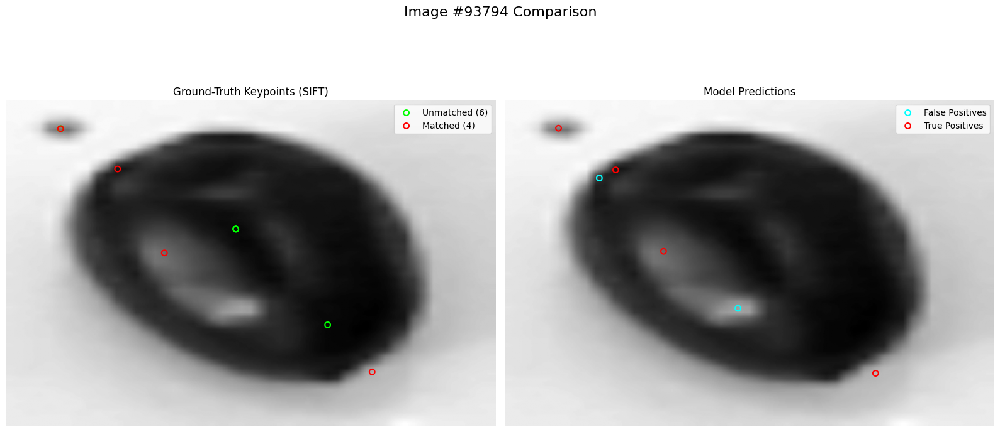

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import random
from types import SimpleNamespace

def analyze_single_random_image(args):
    """
    Selects a random image, analyzes it, and visualizes keypoint matches
    with color-coded distinction between matched and unmatched points.
    """
    print("Selecting a random sample and analyzing...")
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    # 1. Load model and dataset
    model = SuperPointNet().to(device)
    model.load_state_dict(torch.load(args.ckpt_path, map_location=device))
    model.eval()

    dataset = KeypointDataset(args.image_dir, args.label_dir, image_size=args.size, augment=False)
    if len(dataset) == 0:
        print("No images found in the dataset."); return

    # 2. Random sample and model prediction
    random_idx = random.randint(0, len(dataset) - 1)
    img_tensor, _, gt_kpts_padded, _ = dataset[random_idx]

    with torch.no_grad():
        logits_small, _ = model(img_tensor.unsqueeze(0).to(device))
        prob_high_res = torch.sigmoid(F.interpolate(logits_small, size=args.size, mode='bilinear')).squeeze().cpu()
        max_pooled_prob = F.max_pool2d(prob_high_res.unsqueeze(0), kernel_size=args.nms_radius*2+1, stride=1, padding=args.nms_radius).squeeze()
        final_mask = (prob_high_res == max_pooled_prob) & (prob_high_res > args.threshold)
        if not torch.any(final_mask):
            pred_kpts = np.empty((0, 2), dtype=int)
        else:
            ys, xs = torch.nonzero(final_mask, as_tuple=True)
            pred_kpts = torch.stack([xs, ys], dim=1).cpu().numpy()

    # 3. Prepare ground-truth keypoints
    valid_gt_mask = torch.any(gt_kpts_padded != 0, dim=1)
    gt_kpts = gt_kpts_padded[valid_gt_mask].numpy()

    # 4. Compute metrics and match indices
    matches = match_keypoints(pred_kpts, gt_kpts, tol=args.tol)
    tp = len(matches)
    precision = tp / (pred_kpts.shape[0] + 1e-8)
    recall = tp / (gt_kpts.shape[0] + 1e-8)
    f1 = 2 * (precision * recall) / (precision + recall + 1e-8)

    matched_pred_indices = matches[:, 0] if tp > 0 else []
    matched_gt_indices = matches[:, 1] if tp > 0 else []

    unmatched_pred_mask = np.ones(pred_kpts.shape[0], dtype=bool)
    unmatched_pred_mask[matched_pred_indices] = False
    unmatched_gt_mask = np.ones(gt_kpts.shape[0], dtype=bool)
    unmatched_gt_mask[matched_gt_indices] = False

    # 5. Print results
    print("-" * 50); print(f"ANALYSIS RESULT FOR IMAGE #{random_idx}"); print("-" * 50)
    print(f"Parameters: Threshold={args.threshold}, NMS Radius={args.nms_radius}, Tol={args.tol}")
    print(f"Ground-Truth Keypoints : {len(gt_kpts)}")
    print(f"Predicted Keypoints    : {len(pred_kpts)}")
    print(f"True Positives (TP)    : {tp}")
    print(f"Precision              : {precision:.4f}")
    print(f"Recall                 : {recall:.4f}")
    print(f"F1 Score               : {f1:.4f}")
    print("-" * 50)

    # 6. Visualization
    original_image = img_tensor.squeeze().cpu().numpy()
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    fig.suptitle(f"Image #{random_idx} Comparison", fontsize=16)

    # Left: Ground-Truth Keypoints
    axes[0].imshow(original_image, cmap='gray')
    axes[0].scatter(gt_kpts[unmatched_gt_mask, 0], gt_kpts[unmatched_gt_mask, 1], s=40, facecolors='none', edgecolors='lime', linewidth=1.5, label=f'Unmatched ({np.sum(unmatched_gt_mask)})')
    if tp > 0:
        axes[0].scatter(gt_kpts[matched_gt_indices, 0], gt_kpts[matched_gt_indices, 1], s=40, facecolors='none', edgecolors='red', linewidth=1.5, label=f'Matched ({tp})')
    axes[0].set_title("Ground-Truth Keypoints (SIFT)"); axes[0].legend(); axes[0].axis('off')

    # Right: Model Predictions
    axes[1].imshow(original_image, cmap='gray')
    axes[1].scatter(pred_kpts[unmatched_pred_mask, 0], pred_kpts[unmatched_pred_mask, 1], s=40, facecolors='none', edgecolors='cyan', linewidth=1.5, label='False Positives')
    if tp > 0:
        axes[1].scatter(pred_kpts[matched_pred_indices, 0], pred_kpts[matched_pred_indices, 1], s=40, facecolors='none', edgecolors='red', linewidth=1.5, label='True Positives')
    axes[1].set_title("Model Predictions"); axes[1].legend(); axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

analysis_args = SimpleNamespace(
    ckpt_path=MODEL_SAVE_PATH,
    image_dir=IMAGE_FOLDER_PATH,
    label_dir=LABEL_FOLDER_PATH,
    size=(320, 480),
    threshold=0.9,
    nms_radius=4,
    tol=5
)

analyze_single_random_image(analysis_args)


In [ ]:
# This function extracts keypoints and descriptors from an image using the given model.
def get_model_predictions(model, image, device, size=(240, 320), threshold=0.05, nms_radius=4):
    """
    Generates keypoint and descriptor predictions for a given image and model.
    Returns: (pred_kpts, pred_descs) - numpy arrays
    """
    model.eval()

    # Prepare image for model input
    original_size = image.shape[:2]  # (H, W)
    img_resized = cv2.resize(image, (size[1], size[0]))
    img_tensor = torch.from_numpy(img_resized.astype(np.float32)).unsqueeze(0).unsqueeze(0).to(device) / 255.0

    with torch.no_grad():
        logits_small, desc_small = model(img_tensor)
        Hs, Ws = logits_small.shape[2:]

    # Extract keypoints using NMS
    prob_high_res = torch.sigmoid(F.interpolate(logits_small, size=size, mode='bilinear')).squeeze().cpu()
    max_pooled_prob = F.max_pool2d(prob_high_res.unsqueeze(0), kernel_size=nms_radius*2+1, stride=1, padding=nms_radius).squeeze()
    peaks_mask = (prob_high_res == max_pooled_prob)
    final_mask = peaks_mask & (prob_high_res > threshold)

    if not torch.any(final_mask):
        return np.empty((0, 2), dtype=np.float32), np.empty((0, model.descriptor_dim), dtype=np.float32)

    ys, xs = torch.nonzero(final_mask, as_tuple=True)
    pred_kpts_resized = torch.stack([xs, ys], dim=1).cpu().numpy()

    # Rescale coordinates to original image size
    scale_x = original_size[1] / size[1]
    scale_y = original_size[0] / size[0]
    pred_kpts = pred_kpts_resized.astype(np.float32)
    pred_kpts[:, 0] *= scale_x
    pred_kpts[:, 1] *= scale_y

    # Extract descriptors
    scale_x_desc, scale_y_desc = Ws / size[1], Hs / size[0]
    xs_s = np.clip(np.round(pred_kpts_resized[:, 0] * scale_x_desc), 0, Ws - 1).astype(np.int64)
    ys_s = np.clip(np.round(pred_kpts_resized[:, 1] * scale_y_desc), 0, Hs - 1).astype(np.int64)

    desc_cpu_tensor = desc_small[0].cpu()
    pred_descs = desc_cpu_tensor[:, ys_s, xs_s].T.numpy()
    pred_descs = pred_descs / (np.linalg.norm(pred_descs, axis=1, keepdims=True) + 1e-8)

    return pred_kpts, pred_descs

# This function extracts keypoints and descriptors from an image using SIFT.
def get_sift_predictions(image):
    """
    Generates SIFT keypoints and descriptors for a given image.
    Returns: (kpts, descs) - numpy arrays
    """
    sift = cv2.SIFT_create()
    kp_cv, descs = sift.detectAndCompute(image, None)
    if kp_cv is None or len(kp_cv) == 0:
        return np.empty((0, 2), dtype=np.float32), np.empty((0, 128), dtype=np.float32)
    kpts = np.array([kp.pt for kp in kp_cv], dtype=np.float32)
    return kpts, descs


ANALYSIS & VISUALIZATION FUNCTION FOR A STEREO PAIR

In [65]:
import pandas as pd
import matplotlib.pyplot as plt

def analyze_and_visualize_stereo_pair(model, im0_path, im1_path, device, tol=3, size=(240, 320), isVisualize = False):
    """
    Runs both your model and SIFT on a stereo pair, computes metrics,
    and visualizes the results. (KeyPoint formatting bug fixed)
    """
    # Load images
    im0 = cv2.imread(im0_path, cv2.IMREAD_GRAYSCALE)
    im1 = cv2.imread(im1_path, cv2.IMREAD_GRAYSCALE)

    # --- 1. Get Predictions ---
    kpts0_model, descs0_model = get_model_predictions(model, im0, device, size=size)
    kpts1_model, descs1_model = get_model_predictions(model, im1, device, size=size)
    kpts0_sift, descs0_sift = get_sift_predictions(im0)
    kpts1_sift, descs1_sift = get_sift_predictions(im1)

    # --- 2. Compute Metrics ---
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches_model_desc = bf.match(descs0_model, descs1_model) if len(descs0_model) > 0 and len(descs1_model) > 0 else []
    matches_sift_desc = bf.match(descs0_sift, descs1_sift) if len(descs0_sift) > 0 and len(descs1_sift) > 0 else []

    correct_matches_model, correct_matches_sift = 0, 0
    for m in matches_model_desc:
        if abs(kpts0_model[m.queryIdx][1] - kpts1_model[m.trainIdx][1]) <= tol:
            correct_matches_model += 1
    for m in matches_sift_desc:
        if abs(kpts0_sift[m.queryIdx][1] - kpts1_sift[m.trainIdx][1]) <= tol:
            correct_matches_sift += 1

    acc_model = correct_matches_model / (len(matches_model_desc) + 1e-8)
    acc_sift = correct_matches_sift / (len(matches_sift_desc) + 1e-8)

    results = {
        'Metric': ['Matching Accuracy (%)', 'Total Matches', 'Detected Keypoints (im0/im1)'],
        'My Model': [f"{acc_model*100:.2f}", len(matches_model_desc), f"{len(kpts0_model)} / {len(kpts1_model)}"],
        'SIFT':     [f"{acc_sift*100:.2f}", len(matches_sift_desc), f"{len(kpts0_sift)} / {len(kpts1_sift)}"]
    }
    df = pd.DataFrame(results)

    # --- 3. Visualization ---
    if not isVisualize:
        return df
    kp0_model_cv = [cv2.KeyPoint(x=pt[0], y=pt[1], size=10) for pt in kpts0_model]
    kp1_model_cv = [cv2.KeyPoint(x=pt[0], y=pt[1], size=10) for pt in kpts1_model]
    kp0_sift_cv = [cv2.KeyPoint(x=pt[0], y=pt[1], size=10) for pt in kpts0_sift]
    kp1_sift_cv = [cv2.KeyPoint(x=pt[0], y=pt[1], size=10) for pt in kpts1_sift]

    img_matches_model = cv2.drawMatches(im0, kp0_model_cv, im1, kp1_model_cv, matches_model_desc, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    img_matches_sift = cv2.drawMatches(im0, kp0_sift_cv, im1, kp1_sift_cv, matches_sift_desc, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    plt.figure(figsize=(20, 15))
    plt.subplot(2, 1, 1)
    plt.imshow(cv2.cvtColor(img_matches_model, cv2.COLOR_BGR2RGB))
    plt.title(f"My Model - Matches: {len(matches_model_desc)}, Accuracy: {acc_model*100:.2f}%")
    plt.axis('off')

    plt.subplot(2, 1, 2)
    plt.imshow(cv2.cvtColor(img_matches_sift, cv2.COLOR_BGR2RGB))
    plt.title(f"SIFT - Matches: {len(matches_sift_desc)}, Accuracy: {acc_sift*100:.2f}%")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    return df

Root path for evaluation: '/content/middlebury_dataset/data'
-> Successfully found 24 scene folders.
-> Scenes to evaluate (example): ['artroom1', 'artroom2', 'bandsaw1', 'bandsaw2', 'chess1']

====================== Evaluating Scene: artroom1 ======================

--- Numeric Results for Scene: artroom1 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),44.92,84.40
1,Total Matches,1033,1853
2,Detected Keypoints (im0/im1),3018 / 2969,3538 / 3384



====================== Evaluating Scene: artroom2 ======================

--- Numeric Results for Scene: artroom2 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),48.70,84.02
1,Total Matches,1041,1615
2,Detected Keypoints (im0/im1),3038 / 3082,3050 / 3079



====================== Evaluating Scene: bandsaw1 ======================

--- Numeric Results for Scene: bandsaw1 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),56.68,81.39
1,Total Matches,838,1784
2,Detected Keypoints (im0/im1),2305 / 2378,3087 / 3451



====================== Evaluating Scene: bandsaw2 ======================

--- Numeric Results for Scene: bandsaw2 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),50.18,82.32
1,Total Matches,552,1833
2,Detected Keypoints (im0/im1),1504 / 1371,2919 / 2916



====================== Evaluating Scene: chess1 ======================

--- Numeric Results for Scene: chess1 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),41.76,64.24
1,Total Matches,910,990
2,Detected Keypoints (im0/im1),2614 / 2714,2436 / 2458



====================== Evaluating Scene: chess2 ======================


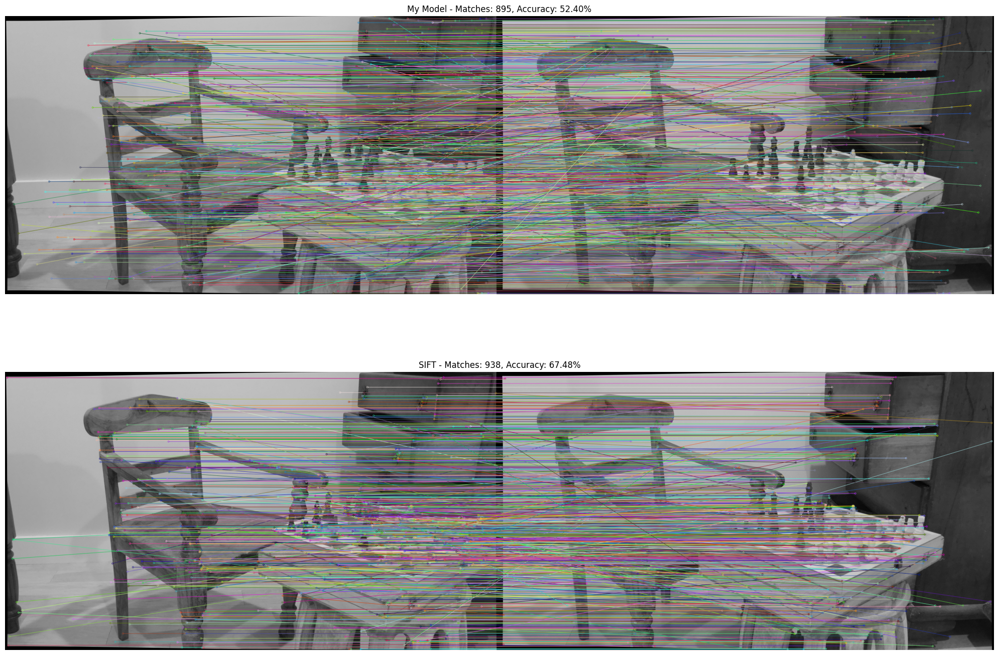


--- Numeric Results for Scene: chess2 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),52.40,67.48
1,Total Matches,895,938
2,Detected Keypoints (im0/im1),2427 / 2487,2187 / 2332



====================== Evaluating Scene: chess3 ======================


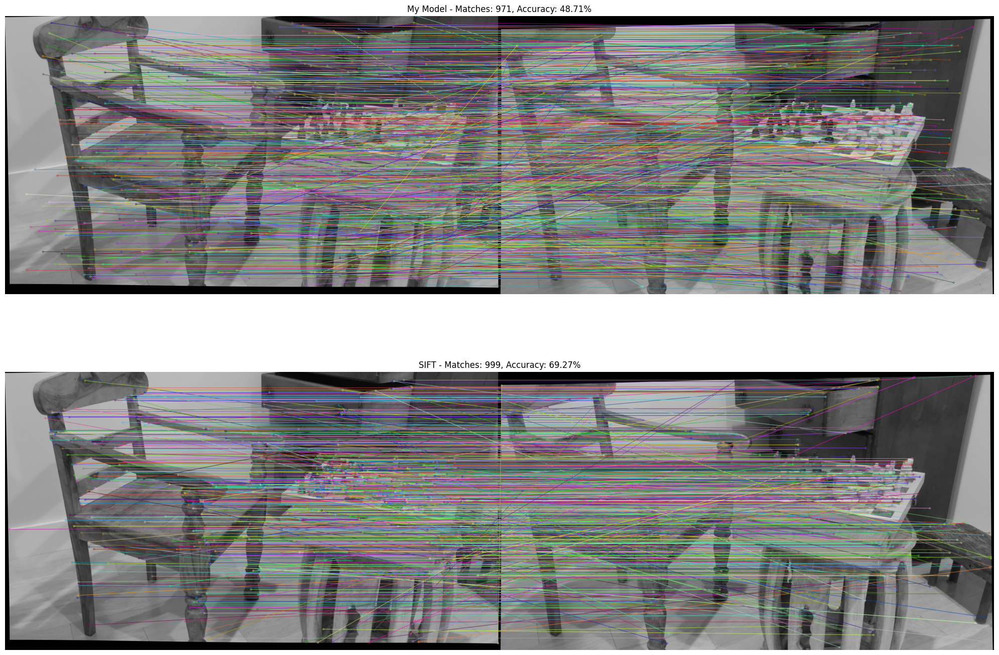


--- Numeric Results for Scene: chess3 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),48.71,69.27
1,Total Matches,971,999
2,Detected Keypoints (im0/im1),2587 / 2734,2359 / 2388



====================== Evaluating Scene: curule1 ======================

--- Numeric Results for Scene: curule1 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),47.74,79.88
1,Total Matches,1173,1904
2,Detected Keypoints (im0/im1),3431 / 3344,4100 / 3937



====================== Evaluating Scene: curule2 ======================

--- Numeric Results for Scene: curule2 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),41.00,74.16
1,Total Matches,1078,1734
2,Detected Keypoints (im0/im1),3438 / 3353,4045 / 4132



====================== Evaluating Scene: curule3 ======================

--- Numeric Results for Scene: curule3 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),45.82,75.07
1,Total Matches,1100,1845
2,Detected Keypoints (im0/im1),3302 / 3191,4090 / 4004



====================== Evaluating Scene: ladder1 ======================

--- Numeric Results for Scene: ladder1 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),54.50,81.03
1,Total Matches,1123,2815
2,Detected Keypoints (im0/im1),2979 / 3086,6125 / 5057



====================== Evaluating Scene: ladder2 ======================

--- Numeric Results for Scene: ladder2 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),59.41,82.34
1,Total Matches,1185,2747
2,Detected Keypoints (im0/im1),3077 / 2988,5005 / 6021



====================== Evaluating Scene: octogons1 ======================

--- Numeric Results for Scene: octogons1 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),42.05,82.29
1,Total Matches,799,3191
2,Detected Keypoints (im0/im1),2528 / 2563,6167 / 6417



====================== Evaluating Scene: octogons2 ======================

--- Numeric Results for Scene: octogons2 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),52.67,81.73
1,Total Matches,936,3043
2,Detected Keypoints (im0/im1),2592 / 2462,5960 / 5697



====================== Evaluating Scene: pendulum1 ======================


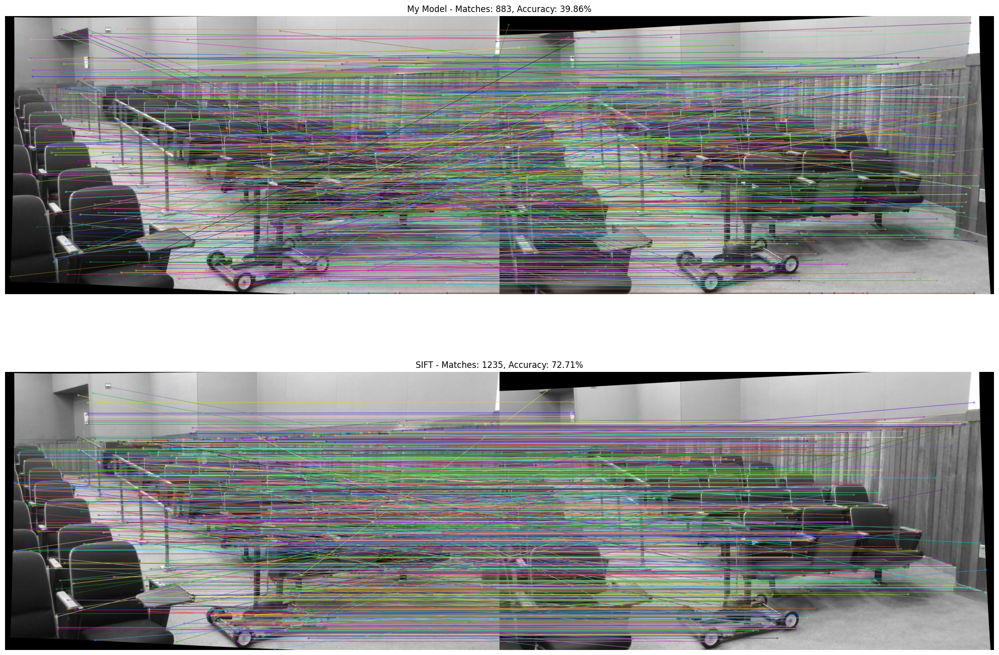


--- Numeric Results for Scene: pendulum1 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),39.86,72.71
1,Total Matches,883,1235
2,Detected Keypoints (im0/im1),2475 / 2636,2588 / 2690



====================== Evaluating Scene: pendulum2 ======================

--- Numeric Results for Scene: pendulum2 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),41.58,78.63
1,Total Matches,909,1034
2,Detected Keypoints (im0/im1),2739 / 2716,2117 / 2046



====================== Evaluating Scene: podium1 ======================

--- Numeric Results for Scene: podium1 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),34.67,80.86
1,Total Matches,646,794
2,Detected Keypoints (im0/im1),2670 / 2013,1722 / 1623



====================== Evaluating Scene: skates1 ======================

--- Numeric Results for Scene: skates1 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),36.92,75.40
1,Total Matches,791,1894
2,Detected Keypoints (im0/im1),2951 / 2649,4044 / 4243



====================== Evaluating Scene: skates2 ======================

--- Numeric Results for Scene: skates2 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),53.13,81.70
1,Total Matches,1039,2115
2,Detected Keypoints (im0/im1),5089 / 8308,4190 / 3944



====================== Evaluating Scene: skiboots1 ======================

--- Numeric Results for Scene: skiboots1 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),50.85,85.51
1,Total Matches,1182,2664
2,Detected Keypoints (im0/im1),3255 / 3048,5065 / 4906



====================== Evaluating Scene: skiboots2 ======================

--- Numeric Results for Scene: skiboots2 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),45.82,71.33
1,Total Matches,1255,2232
2,Detected Keypoints (im0/im1),3844 / 3723,5442 / 5065



====================== Evaluating Scene: skiboots3 ======================

--- Numeric Results for Scene: skiboots3 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),46.82,76.67
1,Total Matches,1303,2563
2,Detected Keypoints (im0/im1),3745 / 3867,5358 / 5564



====================== Evaluating Scene: traproom1 ======================

--- Numeric Results for Scene: traproom1 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),42.61,68.13
1,Total Matches,859,1412
2,Detected Keypoints (im0/im1),2720 / 2895,3357 / 3547



====================== Evaluating Scene: traproom2 ======================

--- Numeric Results for Scene: traproom2 ---


,Metric,My Model,SIFT
0,Matching Accuracy (%),47.03,69.43
1,Total Matches,976,1472
2,Detected Keypoints (im0/im1),2969 / 2917,3541 / 3754




############################################################
###                   SUMMARY TABLE                      ###
############################################################


,scene,Metric,My Model,SIFT
0,artroom1,Matching Accuracy (%),44.92,84.40
1,artroom1,Total Matches,1033,1853
2,artroom1,Detected Keypoints (im0/im1),3018 / 2969,3538 / 3384
3,artroom2,Matching Accuracy (%),48.70,84.02
4,artroom2,Total Matches,1041,1615
...,...,...,...,...
67,traproom1,Total Matches,859,1412
68,traproom1,Detected Keypoints (im0/im1),2720 / 2895,3357 / 3547
69,traproom2,Matching Accuracy (%),47.03,69.43
70,traproom2,Total Matches,976,1472


,Metric,My Model (mean ± std),SIFT (mean ± std)
0,Matching Accuracy (%),46.91 ± 6.19,77.08 ± 6.19
1,Total Matches,978.21 ± 184.28,1862.75 ± 698.08


In [71]:
import os
import pandas as pd
import matplotlib.pyplot as plt

MIDDLEBURY_UNZIP_DESTINATION = '/content/middlebury_dataset'
EVAL_DATA_ROOT = os.path.join(MIDDLEBURY_UNZIP_DESTINATION, 'data')

print(f"Root path for evaluation: '{EVAL_DATA_ROOT}'")

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# 2. Automatically find scenes to evaluate
if os.path.exists(EVAL_DATA_ROOT):
    scenes_to_evaluate = sorted([d for d in os.listdir(EVAL_DATA_ROOT) if os.path.isdir(os.path.join(EVAL_DATA_ROOT, d))])
    print(f"-> Successfully found {len(scenes_to_evaluate)} scene folders.")
    print(f"-> Scenes to evaluate (example): {scenes_to_evaluate[:5]}")
else:
    scenes_to_evaluate = []
    print(f"ERROR: Path '{EVAL_DATA_ROOT}' not found. Make sure the previous cell ran successfully.")

# 3. Load the model (if not already loaded)
# Avoid reloading the model every time this cell is run
if 'model' not in locals() or model is None:
    MODEL_SAVE_PATH = "drive/MyDrive/RGB_D_Dataset/superpoint_model_best_100k.pth"
    model = SuperPointNet().to(DEVICE)
    model.load_state_dict(torch.load(MODEL_SAVE_PATH, map_location=DEVICE))

# 4. Start evaluation for all scenes
all_results = []

if scenes_to_evaluate:

    visualize_scenes = set(random.sample(scenes_to_evaluate, min(3, len(scenes_to_evaluate))))

    for scene in scenes_to_evaluate:
        print(f"\n====================== Evaluating Scene: {scene} ======================")

        # Construct the correct paths for im0.png and im1.png
        im0_path = os.path.join(EVAL_DATA_ROOT, scene, 'im0.png')
        im1_path = os.path.join(EVAL_DATA_ROOT, scene, 'im1.png')

        # Skip if either image is missing
        if not os.path.exists(im0_path) or not os.path.exists(im1_path):
            print(f"-> Skipping scene {scene}: 'im0.png' or 'im1.png' not found.")
            continue

        try:
            # Run the analysis and visualization function defined earlier
            isVisualize = scene in visualize_scenes
            results_df = analyze_and_visualize_stereo_pair(model, im0_path, im1_path, DEVICE, tol=6, size=(1080,1920), isVisualize = isVisualize)

            # Add scene name to the results
            results_df['scene'] = scene
            all_results.append(results_df)

            # Display numeric results
            print(f"\n--- Numeric Results for Scene: {scene} ---")
            display(results_df.drop('scene', axis=1))

        except Exception as e:
            print(f"ERROR: An issue occurred while processing scene {scene}: {e}")

else:
    print("No scenes found for evaluation.")

# 5. Show final summary table for all scenes
if all_results:
    final_summary_df = pd.concat(all_results, ignore_index=True)

    print("\n\n############################################################")
    print("###                   SUMMARY TABLE                      ###")
    print("############################################################")

    # Reorder columns for clarity
    final_summary_df = final_summary_df[['scene', 'Metric', 'My Model', 'SIFT']]
    display(final_summary_df)

    # Filter only the rows of interest
    metrics_of_interest = ['Matching Accuracy (%)', 'Total Matches']
    filtered_df = final_summary_df[final_summary_df['Metric'].isin(metrics_of_interest)].copy()

    # Convert numeric values (ignore keypoint strings)
    filtered_df['My Model'] = pd.to_numeric(filtered_df['My Model'], errors='coerce')
    filtered_df['SIFT'] = pd.to_numeric(filtered_df['SIFT'], errors='coerce')

    # Group by Metric and calculate mean and std
    grouped = filtered_df.groupby('Metric')[['My Model', 'SIFT']].agg(['mean', 'std']).round(2)

    # Reformat into "mean ± std"
    summary_df = pd.DataFrame({
        'My Model (mean ± std)': grouped.apply(lambda row: f"{row[('My Model', 'mean')]} ± {row[('My Model', 'std')]}", axis=1),
        'SIFT (mean ± std)': grouped.apply(lambda row: f"{row[('SIFT', 'mean')]} ± {row[('SIFT', 'std')]}", axis=1),
    })

    # Optional: reset index for display
    summary_df = summary_df.reset_index()

    # Display result
    display(summary_df)

In [62]:
# ================================================================
#  FULL STEREO-EVALUATION LOOP  (Repeatability • Accuracy • mAP • Speed)
# ================================================================
import os, cv2, time, torch, numpy as np
import pandas as pd
import torch.nn.functional as F
from tqdm.auto import tqdm
from sklearn.metrics import precision_recall_curve, average_precision_score

# ───────────────── helper: read PFM ─────────────────
def read_pfm(path):
    with open(path, 'rb') as f:
        h = f.readline().rstrip().decode('ascii')
        color = h == 'PF'
        while True:  # skip comments
            line = f.readline().decode('ascii')
            if line[0] != '#':
                w, h = map(int, line.split())
                break
        scale = float(f.readline().decode('ascii'))
        endian = '<' if scale < 0 else '>'
        data = np.fromfile(f, endian + 'f')
    img = np.flipud(data.reshape(h, w, 3) if color else data.reshape(h, w))
    return img, abs(scale)

# ───────────────── helper: repeatability ─────────────────
def compute_repeatability(kp0, kp1, disp0, tol=2):
    H, W = disp0.shape
    if kp0.size == 0 or kp1.size == 0:  # no keypoints
        return 0.0, 0, 0
    ints = np.round(kp0).astype(int)
    mask = (ints[:,0] >= 0) & (ints[:,0] < W) & (ints[:,1] >= 0) & (ints[:,1] < H)
    ints = ints[mask]
    if ints.size == 0: return 0.0, 0, 0
    d = disp0[ints[:,1], ints[:,0]]
    proj = np.column_stack([kp0[mask,0] - d, kp0[mask,1]])
    proj_mask = (proj[:,0] >= 0) & (proj[:,0] < W)
    proj = proj[proj_mask]
    if proj.size == 0: return 0.0, 0, 0
    from scipy.spatial import cKDTree
    hit = [len(l) > 0 for l in cKDTree(kp1).query_ball_point(proj, tol)]
    return np.mean(hit), int(sum(hit)), proj.shape[0]

# ───────────────── helper: descriptor mAP ─────────────────
def descriptor_map(desc0, desc1, kp0, kp1, disp0, tol=2):
    if desc0.size == 0 or desc1.size == 0: return 0.0
    H, W = disp0.shape
    ints = np.round(kp0).astype(int)
    d = disp0[ints[:,1], ints[:,0]]
    proj = np.column_stack([kp0[:,0] - d, kp0[:,1]])
    valid = (proj[:,0] >= 0) & (proj[:,0] < W)
    proj = proj[valid]; desc0 = desc0[valid]
    # Find positive descriptor matches
    from scipy.spatial import cKDTree
    tree = cKDTree(kp1); L = []
    for i, (x, y) in enumerate(proj):
        js = tree.query_ball_point([x, y], tol)
        for j in js: L.append((i, j))
    if len(L) == 0: return 0.0
    S = (desc0 @ desc1.T).flatten()  # cosine similarity
    labels = np.zeros_like(S, dtype=int)
    for i, j in L:
        labels[i * desc1.shape[0] + j] = 1
    return average_precision_score(labels, S)

# ───────────────── helper: inference speed ─────────────────
@torch.no_grad()
def inference_ms(model, x, n=30):
    torch.cuda.synchronize(); t0 = time.time()
    for _ in range(n): _ = model(x)
    torch.cuda.synchronize(); return (time.time() - t0) / n * 1000

# ───────────────── main evaluation loop ─────────────────
def evaluate_middlebury(model, data_root, device,
                        size=(240,320), thresh=0.05,
                        nms_r=4, tol=2):
    scenes = sorted([d for d in os.listdir(data_root)
                     if os.path.isdir(os.path.join(data_root, d))])
    rows = []
    for sc in scenes:
        im0 = cv2.imread(os.path.join(data_root, sc, 'im0.png'),
                         cv2.IMREAD_GRAYSCALE)
        im1 = cv2.imread(os.path.join(data_root, sc, 'im1.png'),
                         cv2.IMREAD_GRAYSCALE)
        disp0, _ = read_pfm(os.path.join(data_root, sc, 'disp0.pfm'))

        kp0, d0 = get_model_predictions(model, im0, device,
                                        size=size, threshold=thresh,
                                        nms_radius=nms_r)
        kp1, d1 = get_model_predictions(model, im1, device,
                                        size=size, threshold=thresh,
                                        nms_radius=nms_r)

        rep, rep_ok, rep_tot = compute_repeatability(kp0, kp1, disp0, tol)
        acc = rep_ok / (kp0.shape[0] + 1e-8)  # stereo-matching accuracy
        ap = descriptor_map(d0, d1, kp0, kp1, disp0, tol)

        # Measure inference time
        img_res = cv2.resize(im0, (size[1], size[0]))
        t_infer = inference_ms(model,
                               torch.from_numpy(img_res).float().unsqueeze(0).unsqueeze(0).to(device) / 255.)

        rows.append(dict(scene=sc,
                         n_kp0=len(kp0), n_kp1=len(kp1),
                         repeatability=rep,
                         matching_acc=acc,
                         desc_mAP=ap,
                         ms_per_img=t_infer))
    df = pd.DataFrame(rows)
    print("\n===== SUMMARY =====")
    display(df.round(3))
    print("\nMean values")

    # numeric cols
    df_numeric = df.select_dtypes(include=[np.number])

    # Calc
    mean_vals = df_numeric.mean().round(3)
    std_vals = df_numeric.std().round(3)

    # ± std
    mean_std_combined = mean_vals.astype(str) + " ± " + std_vals.astype(str)

    # DataFrame
    summary_df = mean_std_combined.to_frame().T
    display(summary_df)
    return df

# ───────────────── run ─────────────────
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
model = SuperPointNet().to(DEVICE)
model.load_state_dict(torch.load(MODEL_SAVE_PATH, map_location=DEVICE))

DATA_ROOT = '/content/middlebury_dataset/data'
metrics_df = evaluate_middlebury(model, DATA_ROOT, DEVICE,
                                 size=(1080,1920), thresh=0.5,
                                 nms_r=3, tol=5)



===== SUMMARY =====


,scene,n_kp0,n_kp1,repeatability,matching_acc,desc_mAP,ms_per_img
0,artroom1,2118,2078,0.395,0.360,0.051,67.549
1,artroom2,2329,2363,0.426,0.390,0.047,67.939
2,bandsaw1,1654,1613,0.455,0.414,0.072,67.922
3,bandsaw2,1099,1024,0.440,0.342,0.090,67.901
4,chess1,1771,1746,0.413,0.369,0.050,67.580
5,chess2,1757,1726,0.457,0.405,0.086,67.660
6,chess3,1731,1838,0.412,0.358,0.103,67.805
7,curule1,2583,2497,0.478,0.437,0.026,67.673
8,curule2,2562,2519,0.449,0.399,0.047,67.762
9,curule3,2392,2333,0.431,0.396,0.089,68.008



Mean values


,n_kp0,n_kp1,repeatability,matching_acc,desc_mAP,ms_per_img
0,2159.333 ± 502.877,2157.792 ± 503.817,0.423 ± 0.059,0.368 ± 0.065,0.061 ± 0.035,67.992 ± 0.234
